<a href="https://colab.research.google.com/github/VikashKumar-1996/Exploring-Polymer-Conformation-using-VAE/blob/main/Polymer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Epoch 1/500, Loss: 1017.2162369140625
Epoch 2/500, Loss: 939.218996484375
Epoch 3/500, Loss: 901.5513884765625
Epoch 4/500, Loss: 886.5201171875
Epoch 5/500, Loss: 878.9770229492187
Epoch 6/500, Loss: 873.5228530273438
Epoch 7/500, Loss: 869.6773178710938
Epoch 8/500, Loss: 864.2288973632812
Epoch 9/500, Loss: 860.77191953125
Epoch 10/500, Loss: 856.962455078125
Epoch 11/500, Loss: 851.9122991210937
Epoch 12/500, Loss: 849.5061411132813
Epoch 13/500, Loss: 845.2686197265625
Epoch 14/500, Loss: 842.1871826171875
Epoch 15/500, Loss: 839.3737086914063
Epoch 16/500, Loss: 835.56909453125
Epoch 17/500, Loss: 832.3980736328125
Epoch 18/500, Loss: 829.4712078125
Epoch 19/500, Loss: 828.2315751953125
Epoch 20/500, Loss: 823.86018203125
Epoch 21/500, Loss: 822.793850390625
Epoch 22/500, Loss: 819.6528017578125
Epoch 23/500, Loss: 817.3258268554688
Epoch 24/500, Loss: 815.0991
Epoch 25/500, Loss: 812.5052322265625
Epoch 26/500, Loss: 812.2272356445312
Epoch 27/500, Loss: 810.0678284179687
Epoch 

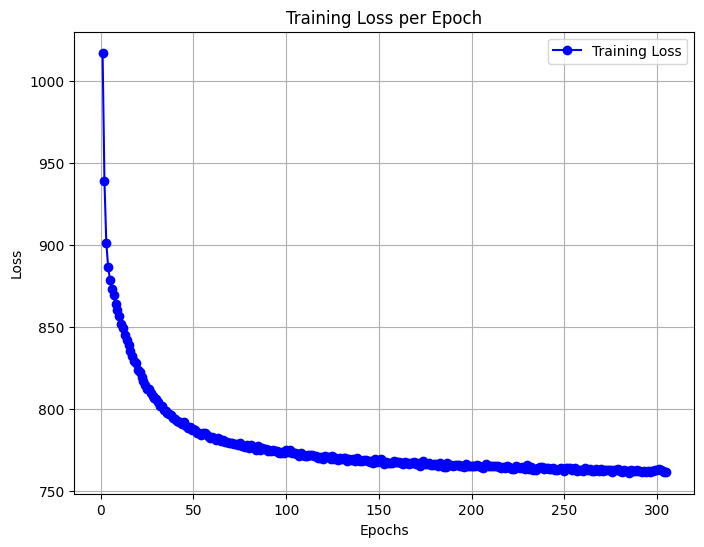

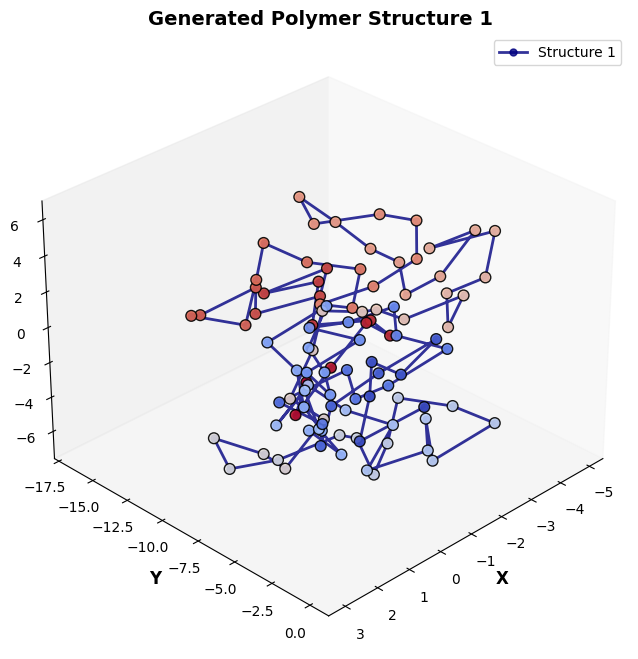

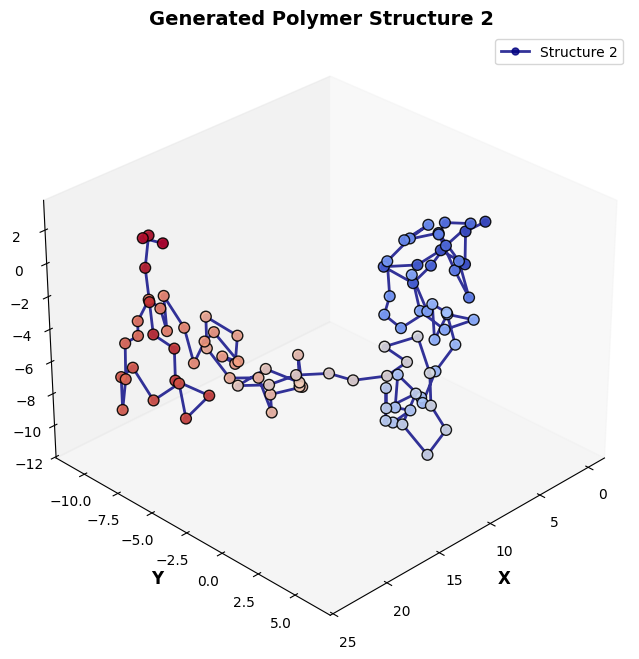

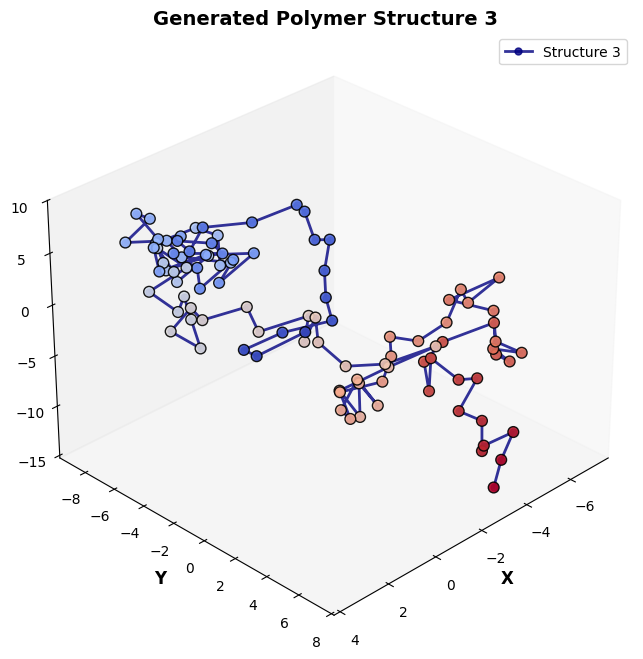

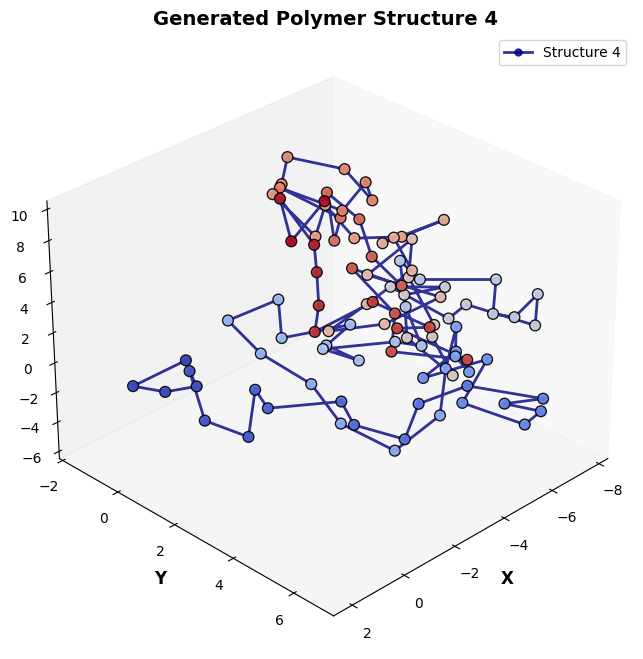

...

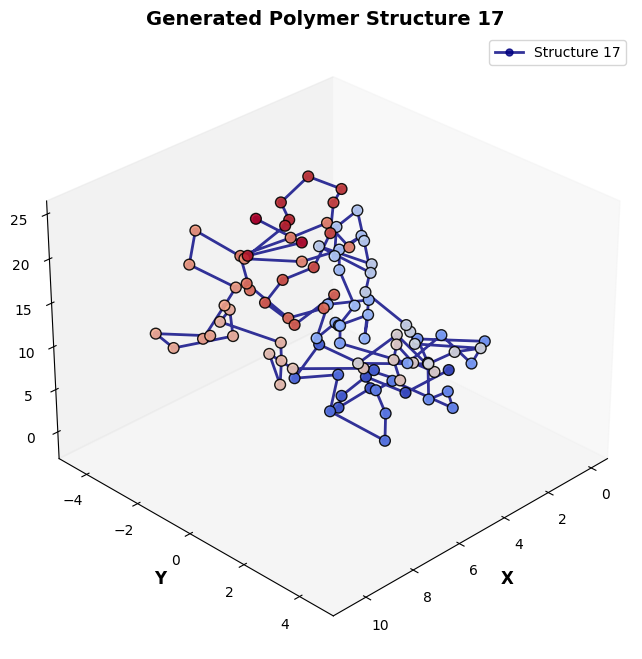

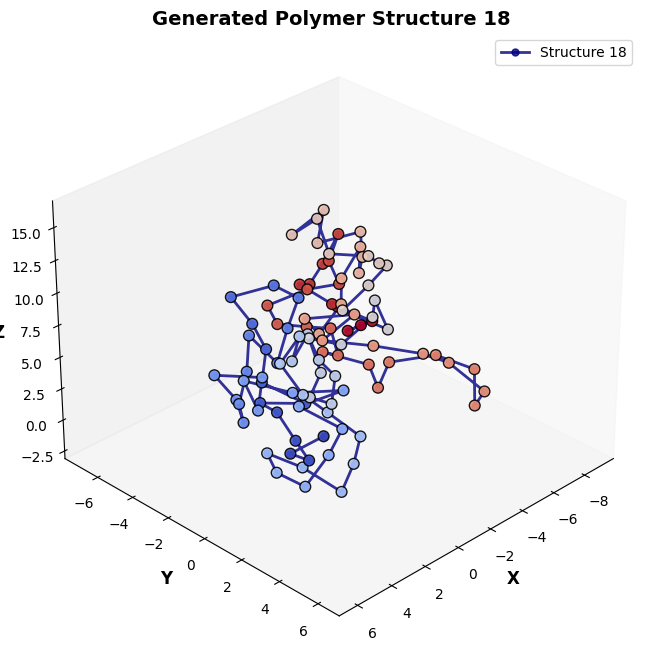

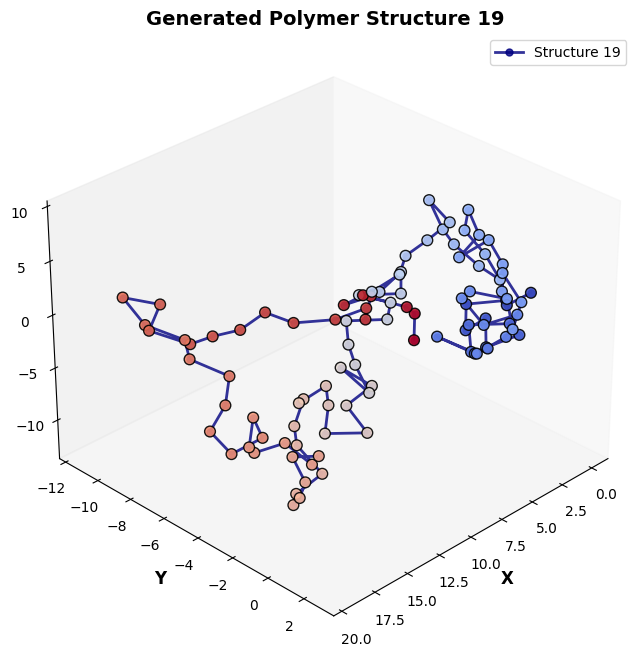

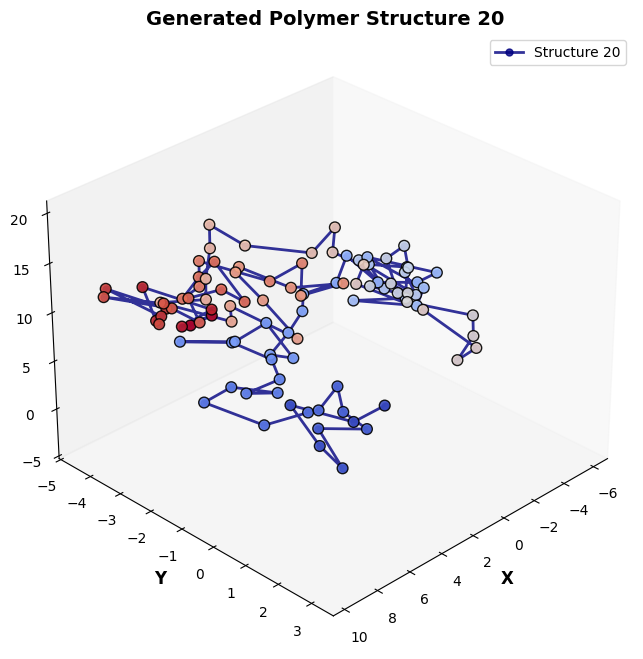

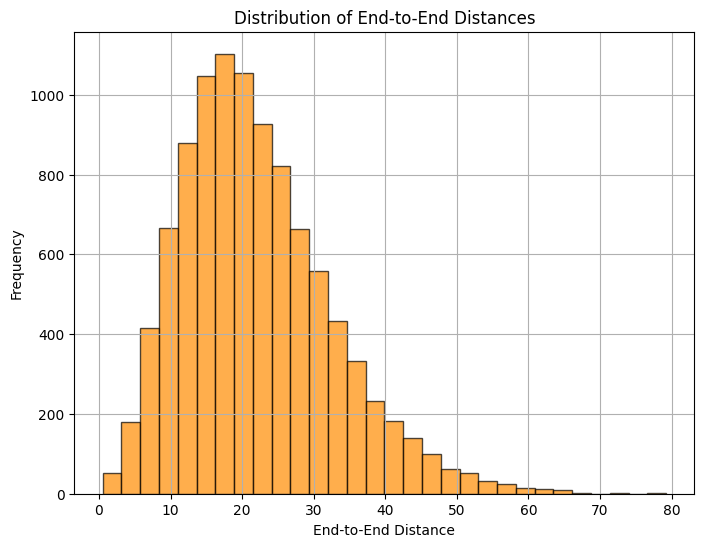

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R

# Load internal coordinates
internal_coords = np.load("/content/internal_coords_optimized.npy")

# Hyperparameters
latent_dim = 40  # Dimensionality of the latent space
batch_size = 64
epochs = 500
bond_length_target = 2.0  # Desired bond length
patience = 20  # Number of epochs to wait before early stopping

# Convert internal coordinates to PyTorch tensors
X = torch.tensor(internal_coords, dtype=torch.float32)

# Define the VAE model
class VAE(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 400)
        self.dropout = nn.Dropout(0.3)  # 30% dropout
        self.fc2 = nn.Linear(400, latent_dim)
        self.fc21 = nn.Linear(400, latent_dim)
        self.fc22 = nn.Linear(400, latent_dim)
        self.fc3 = nn.Linear(latent_dim, 400)
        self.fc4 = nn.Linear(400, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc21(h1), self.fc22(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h3 = torch.relu(self.fc3(z))
        recon_x = self.fc4(h3)

        # Add controlled Gaussian noise to break smooth transitions
        noise = torch.randn_like(recon_x) * 1.4
        recon_x[:, 1:] += noise[:, :-1]  # Add noise to adjacent values

        return recon_x

    def decode_with_fixed_bond_length(self, z, bond_length_target=2.0):
        h3 = torch.relu(self.fc3(z))
        recon_x = self.fc4(h3)
        recon_x += torch.randn_like(recon_x) * 0.05  # Small noise

        new_recon_x = recon_x.clone()  # Avoid in-place modification
        for i in range(1, new_recon_x.shape[0]):
            direction = new_recon_x[i] - new_recon_x[i - 1]
            direction /= torch.norm(direction)  # Normalize the direction
            new_recon_x[i] = new_recon_x[i - 1] + bond_length_target * direction  # Scale to bond length

        return new_recon_x

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar


# Bond length penalty function (using PyTorch)
def bond_length_penalty(coords, bond_length_target=2.0):
    bond_lengths = torch.norm(torch.diff(coords, dim=0), dim=1)
    return torch.sum(torch.abs(bond_lengths - bond_length_target))


# Self-avoidance penalty function (using PyTorch)
def self_avoidance_penalty(coords, min_distance=2.0):
    n_beads = coords.shape[0]
    penalty = 0.0
    for i in range(n_beads):
        for j in range(i + 2, n_beads):
            dist = torch.norm(coords[i] - coords[j])
            if dist < min_distance:
                penalty += (min_distance - dist) ** 12  # Penalize overlap
    return penalty


# Loss function with bond length and self-avoidance penalties
def loss_function(recon_x, x, mu, logvar, bond_length_target=2.0):
    BCE = nn.MSELoss(reduction='sum')(recon_x, x)
    KL = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    # Compute bond length penalty and self-avoidance penalty using PyTorch tensors
    bond_penalty = bond_length_penalty(recon_x, bond_length_target)
    avoidance_penalty = self_avoidance_penalty(recon_x, bond_length_target)

    return BCE + KL + bond_penalty + avoidance_penalty


# Prepare the data loader
dataset = TensorDataset(X)
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Initialize model, optimizer
model = VAE(input_dim=internal_coords.shape[1], latent_dim=latent_dim)
optimizer = optim.AdamW(model.parameters(), lr=1e-3)  # Using AdamW optimizer

# Early stopping initialization
best_loss = float('inf')
no_improvement = 0

# Store losses for visualization
epoch_losses = []

# Train the model
for epoch in range(epochs):
    model.train()
    train_loss = 0
    for batch_idx, (data,) in enumerate(train_loader):
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(data)
        loss = loss_function(recon_batch, data, mu, logvar, bond_length_target)
        loss.backward()
        train_loss += loss.item()
        optimizer.step()

    avg_loss = train_loss / len(train_loader.dataset)
    epoch_losses.append(avg_loss)  # Store loss for this epoch
    print(f"Epoch {epoch + 1}/{epochs}, Loss: {avg_loss}")

    # Early stopping check
    if avg_loss < best_loss:
        best_loss = avg_loss
        no_improvement = 0
        torch.save(model.state_dict(), 'best_vae_model.pth')
    else:
        no_improvement += 1
        if no_improvement >= patience:
            print(f"No improvement for {patience} epochs, stopping training...")
            break

# Plot loss curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(epoch_losses) + 1), epoch_losses, marker='o', linestyle='--', color='b', label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training Loss per Epoch")
plt.grid(True)
plt.legend()
plt.show()


# Load the best model
model.load_state_dict(torch.load('best_vae_model.pth'))

# Generate new polymer conformations using the trained VAE model
model.eval()
num_samples = 10000
latent_samples = torch.randn(num_samples, latent_dim) * 2.5  # Increase spread

generated_internal_coords = model.decode(latent_samples).detach().cpu().numpy()


# Function to convert internal coordinates to Cartesian coordinates
def internal_to_cartesian(internal_coords, num_beads=100, bond_length=2.0):
    coords = np.zeros((num_beads, 3))

    bond_lengths = internal_coords[:num_beads - 1]
    bond_angles = internal_coords[num_beads - 1:num_beads - 1 + (num_beads - 2)]
    torsional_angles = internal_coords[num_beads - 1 + (num_beads - 2):]

    # Initialize first bond
    coords[1] = coords[0] + np.array([bond_length, 0, 0])

    for i in range(2, num_beads):
        bond_vec = np.array([bond_lengths[i - 1], 0, 0])  # Start with bond along x-axis
        rot_bond = R.from_euler('y', bond_angles[i - 2], degrees=False).as_matrix()
        rot_torsion = R.from_euler('z', torsional_angles[i - 3], degrees=False).as_matrix()

        bond_vec = rot_bond @ bond_vec
        bond_vec = rot_torsion @ bond_vec

        # Scale bond vector to exactly match the bond length
        bond_vec = bond_length * bond_vec / np.linalg.norm(bond_vec)

        coords[i] = coords[i - 1] + bond_vec

    return coords


# Convert generated internal coordinates to Cartesian coordinates
generated_cartesian_coords = [internal_to_cartesian(internal_coord) for internal_coord in generated_internal_coords]

# Plot the first five generated polymer structures
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Loop through the first five generated polymer structures and plot them separately
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

for i, coords in enumerate(generated_cartesian_coords[:20]):
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plot polymer backbone with a smooth curve
    ax.plot(coords[:, 0], coords[:, 1], coords[:, 2], marker='o', linestyle='-', color="navy", markersize=5, linewidth=2, alpha=0.8, label=f'Structure {i + 1}')

    # Scatter plot for atoms with gradient color
    scatter = ax.scatter(coords[:, 0], coords[:, 1], coords[:, 2], c=np.linspace(0, 1, len(coords)), cmap='coolwarm', s=60, edgecolor='black', alpha=0.9)

    # Labels and title
    ax.set_xlabel('X', fontsize=12, fontweight='bold')
    ax.set_ylabel('Y', fontsize=12, fontweight='bold')
    ax.set_zlabel('Z', fontsize=12, fontweight='bold')
    ax.set_title(f'Generated Polymer Structure {i + 1}', fontsize=14, fontweight='bold')

    # Adjust viewing angle
    ax.view_init(elev=30, azim=45)

    # Remove background grid for a cleaner look
    ax.grid(False)

    # Add legend
    ax.legend(loc='upper right', fontsize=10)

    plt.show()


# Function to compute end-to-end distances
def calculate_end_to_end_distances(cartesian_coords):
    return [np.linalg.norm(coords[-1] - coords[0]) for coords in cartesian_coords]

# Compute end-to-end distances for generated structures
end_to_end_distances = calculate_end_to_end_distances(generated_cartesian_coords)

# Plot the end-to-end distance distribution
plt.figure(figsize=(8, 6))
plt.hist(end_to_end_distances, bins=30, color='darkorange', edgecolor='black', alpha=0.7)
plt.xlabel("End-to-End Distance")
plt.ylabel("Frequency")
plt.title("Distribution of End-to-End Distances")
plt.grid(True)
plt.show()





Epoch 1/500, Loss: 1017.8810346679687
Epoch 2/500, Loss: 942.880576171875
Epoch 3/500, Loss: 904.982430078125
Epoch 4/500, Loss: 888.7265750976562
Epoch 5/500, Loss: 879.3418095703125
Epoch 6/500, Loss: 873.3513447265625
Epoch 7/500, Loss: 868.6134436523438
Epoch 8/500, Loss: 864.9317111328126
Epoch 9/500, Loss: 859.8513282226562
Epoch 10/500, Loss: 857.0137341796875
Epoch 11/500, Loss: 853.38202734375
Epoch 12/500, Loss: 849.1521051757812
Epoch 13/500, Loss: 844.3515084960937
Epoch 14/500, Loss: 841.3347030273437
Epoch 15/500, Loss: 838.6799857421875
Epoch 16/500, Loss: 835.1199998046875
Epoch 17/500, Loss: 832.505590234375
Epoch 18/500, Loss: 828.6174211914063
Epoch 19/500, Loss: 826.2926770507812
Epoch 20/500, Loss: 823.2879114257812
Epoch 21/500, Loss: 822.391517578125
Epoch 22/500, Loss: 819.57368984375
Epoch 23/500, Loss: 816.1551784179687
Epoch 24/500, Loss: 814.6683969726563
Epoch 25/500, Loss: 813.30215390625
Epoch 26/500, Loss: 811.21073828125
Epoch 27/500, Loss: 809.68247519

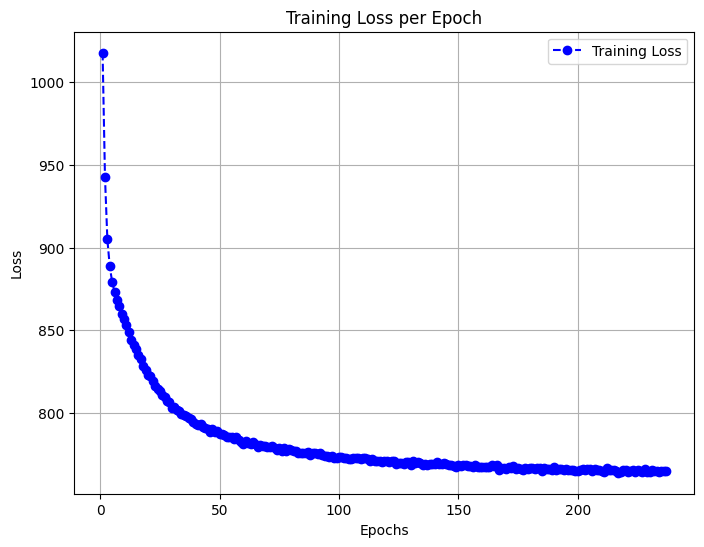

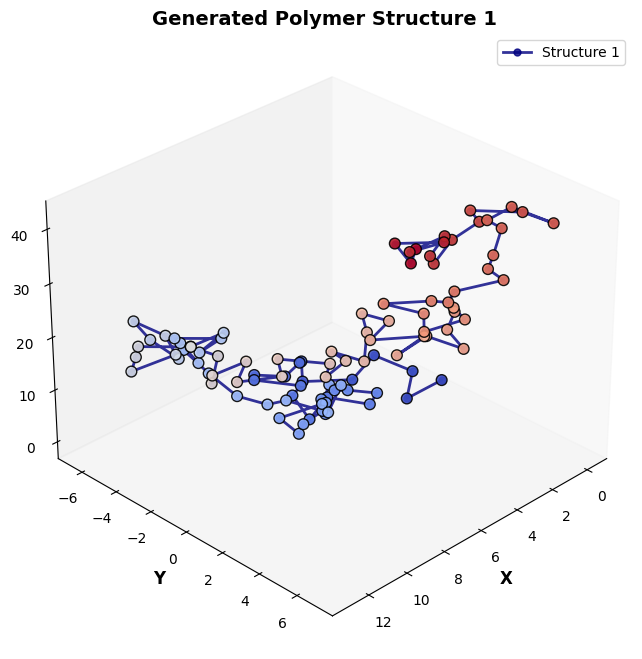

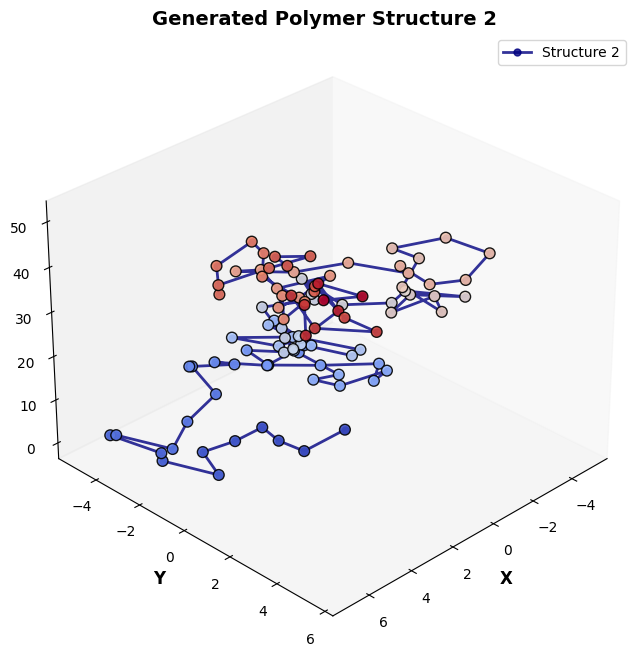

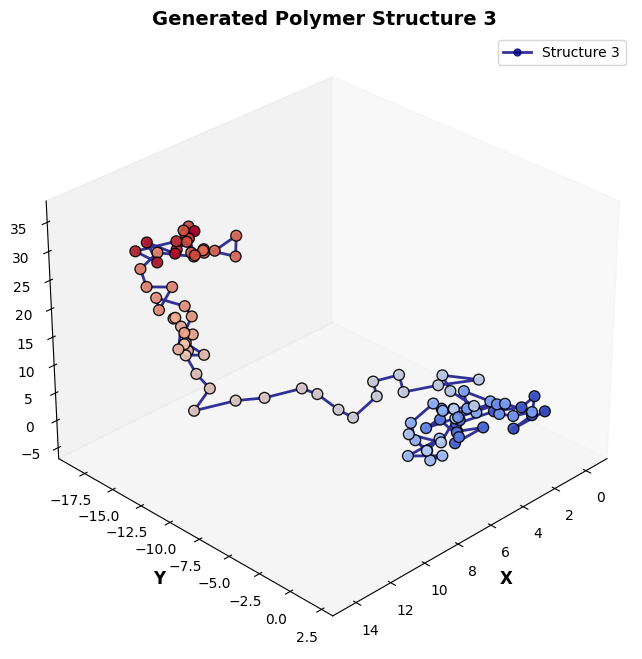

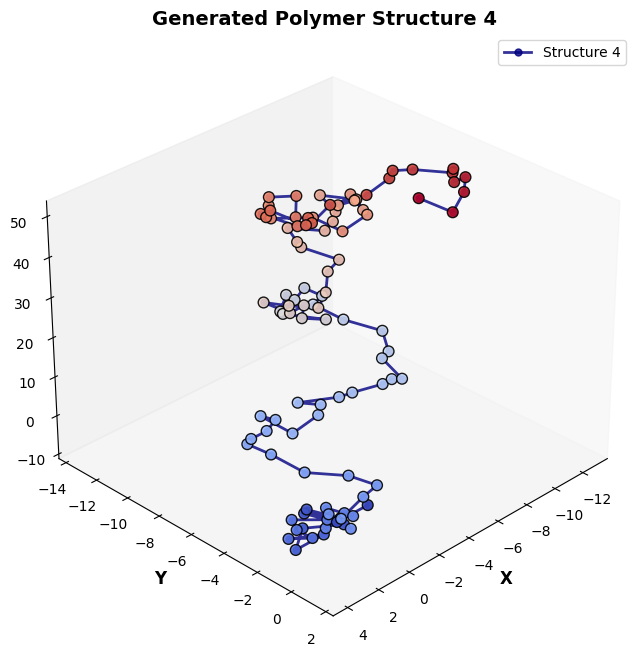

...

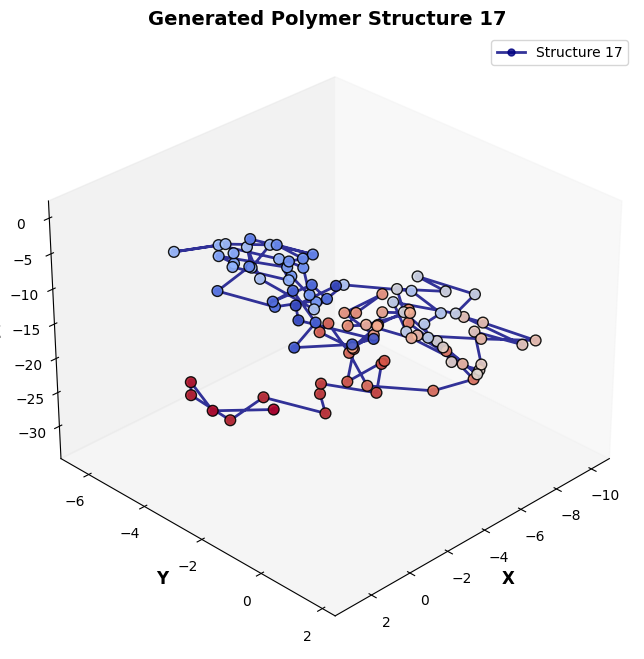

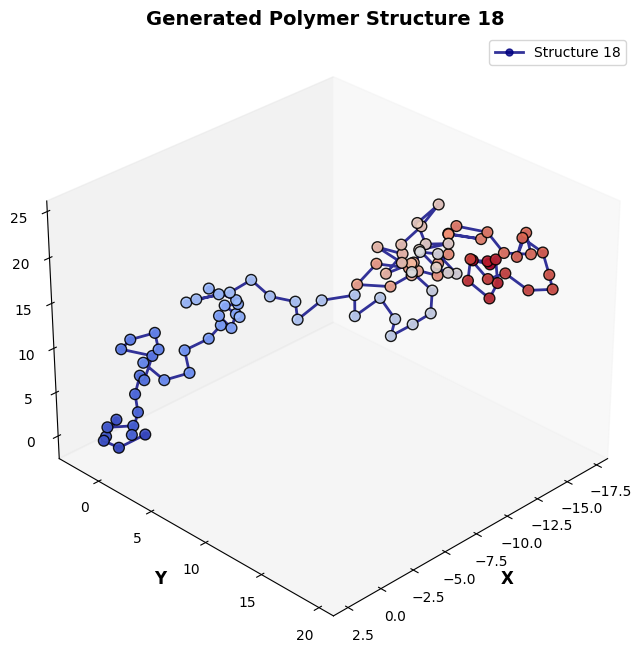

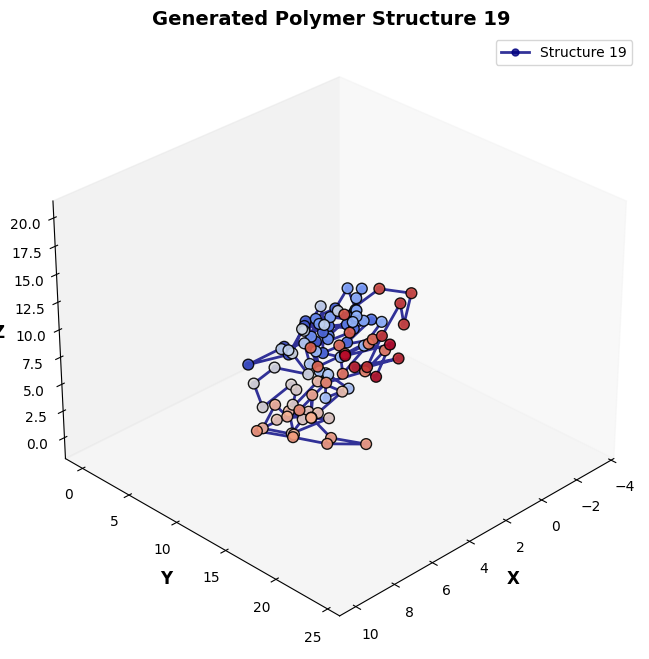

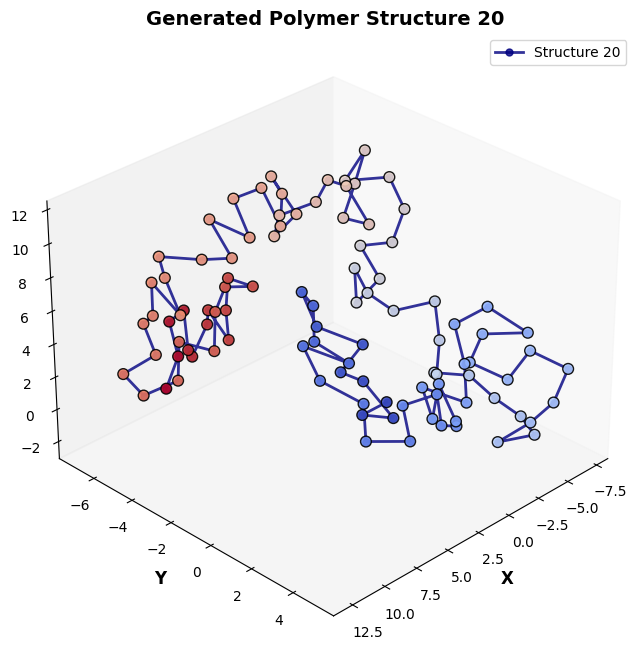

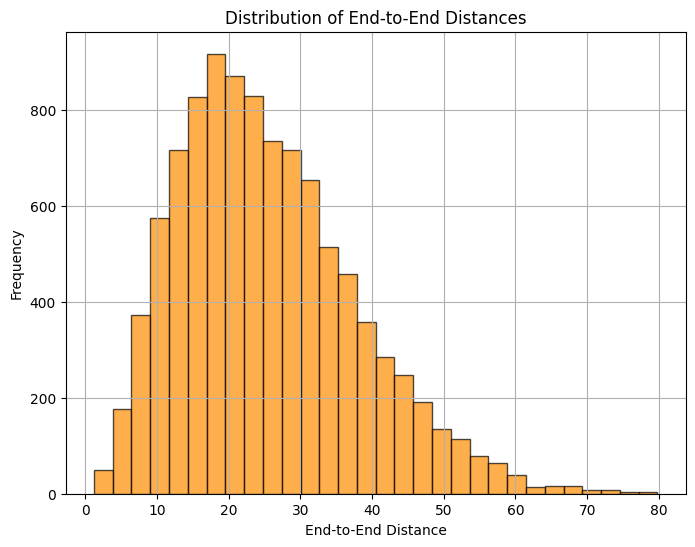

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R

# Load internal coordinates
internal_coords = np.load("/content/internal_coords_optimized.npy")

# Hyperparameters
latent_dim = 40  # Dimensionality of the latent space
batch_size = 64
epochs = 500
bond_length_target = 2.0  # Desired bond length
patience = 20  # Number of epochs to wait before early stopping

# Convert internal coordinates to PyTorch tensors
X = torch.tensor(internal_coords, dtype=torch.float32)

# Define the VAE model
class VAE(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 400)
        self.dropout = nn.Dropout(0.3)  # 30% dropout
        self.fc2 = nn.Linear(400, latent_dim)
        self.fc21 = nn.Linear(400, latent_dim)
        self.fc22 = nn.Linear(400, latent_dim)
        self.fc3 = nn.Linear(latent_dim, 400)
        self.fc4 = nn.Linear(400, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc21(h1), self.fc22(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h3 = torch.relu(self.fc3(z))
        recon_x = self.fc4(h3)

        # Add controlled Gaussian noise to break smooth transitions
        noise = torch.randn_like(recon_x) * 1.4
        recon_x[:, 1:] += noise[:, :-1]  # Add noise to adjacent values

        return recon_x

    def decode_with_fixed_bond_length(self, z, bond_length_target=2.0):
        h3 = torch.relu(self.fc3(z))
        recon_x = self.fc4(h3)
        recon_x += torch.randn_like(recon_x) * 0.05  # Small noise

        new_recon_x = recon_x.clone()  # Avoid in-place modification
        for i in range(1, new_recon_x.shape[0]):
            direction = new_recon_x[i] - new_recon_x[i - 1]
            direction /= torch.norm(direction)  # Normalize the direction
            new_recon_x[i] = new_recon_x[i - 1] + bond_length_target * direction  # Scale to bond length

        return new_recon_x

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar


# Bond length penalty function (using PyTorch)
def bond_length_penalty(coords, bond_length_target=2.0):
    bond_lengths = torch.norm(torch.diff(coords, dim=0), dim=1)
    return torch.sum(torch.abs(bond_lengths - bond_length_target))


# Self-avoidance penalty function (using PyTorch)
def self_avoidance_penalty(coords, min_distance=2.0):
    n_beads = coords.shape[0]
    penalty = 0.0
    for i in range(n_beads):
        for j in range(i + 2, n_beads):
            dist = torch.norm(coords[i] - coords[j])
            if dist < min_distance:
                penalty += (min_distance - dist) ** 12  # Penalize overlap
    return penalty


# Loss function with bond length and self-avoidance penalties
def loss_function(recon_x, x, mu, logvar, bond_length_target=2.0):
    BCE = nn.MSELoss(reduction='sum')(recon_x, x)
    KL = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    # Compute bond length penalty and self-avoidance penalty using PyTorch tensors
    bond_penalty = bond_length_penalty(recon_x, bond_length_target)
    avoidance_penalty = self_avoidance_penalty(recon_x, bond_length_target)

    return BCE + KL + bond_penalty + avoidance_penalty


# Prepare the data loader
dataset = TensorDataset(X)
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Initialize model, optimizer
model = VAE(input_dim=internal_coords.shape[1], latent_dim=latent_dim)
optimizer = optim.AdamW(model.parameters(), lr=1e-3)  # Using AdamW optimizer

# Early stopping initialization
best_loss = float('inf')
no_improvement = 0

# Store losses for visualization
epoch_losses = []

# Train the model
for epoch in range(epochs):
    model.train()
    train_loss = 0
    for batch_idx, (data,) in enumerate(train_loader):
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(data)
        loss = loss_function(recon_batch, data, mu, logvar, bond_length_target)
        loss.backward()
        train_loss += loss.item()
        optimizer.step()

    avg_loss = train_loss / len(train_loader.dataset)
    epoch_losses.append(avg_loss)  # Store loss for this epoch
    print(f"Epoch {epoch + 1}/{epochs}, Loss: {avg_loss}")

    # Early stopping check
    if avg_loss < best_loss:
        best_loss = avg_loss
        no_improvement = 0
        torch.save(model.state_dict(), 'best_vae_model.pth')
    else:
        no_improvement += 1
        if no_improvement >= patience:
            print(f"No improvement for {patience} epochs, stopping training...")
            break

# Plot loss curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(epoch_losses) + 1), epoch_losses, marker='o', linestyle='--', color='b', label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training Loss per Epoch")
plt.grid(True)
plt.legend()
plt.show()


# Load the best model
model.load_state_dict(torch.load('best_vae_model.pth'))

# Generate new polymer conformations using the trained VAE model
model.eval()
num_samples = 1000
latent_samples = torch.randn(num_samples, latent_dim) * 2.5  # Increase spread

generated_internal_coords = model.decode(latent_samples).detach().cpu().numpy()


# Function to convert internal coordinates to Cartesian coordinates
def internal_to_cartesian(internal_coords, num_beads=100, bond_length=2.0):
    coords = np.zeros((num_beads, 3))

    bond_lengths = internal_coords[:num_beads - 1]
    bond_angles = internal_coords[num_beads - 1:num_beads - 1 + (num_beads - 2)]
    torsional_angles = internal_coords[num_beads - 1 + (num_beads - 2):]

    # Initialize first bond
    coords[1] = coords[0] + np.array([bond_length, 0, 0])

    for i in range(2, num_beads):
        bond_vec = np.array([bond_lengths[i - 1], 0, 0])  # Start with bond along x-axis
        rot_bond = R.from_euler('y', bond_angles[i - 2], degrees=False).as_matrix()
        rot_torsion = R.from_euler('z', torsional_angles[i - 3], degrees=False).as_matrix()

        bond_vec = rot_bond @ bond_vec
        bond_vec = rot_torsion @ bond_vec

        # Scale bond vector to exactly match the bond length
        bond_vec = bond_length * bond_vec / np.linalg.norm(bond_vec)

        coords[i] = coords[i - 1] + bond_vec

    return coords


# Convert generated internal coordinates to Cartesian coordinates
generated_cartesian_coords = [internal_to_cartesian(internal_coord) for internal_coord in generated_internal_coords]

# Plot the first five generated polymer structures
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Loop through the first five generated polymer structures and plot them separately
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

for i, coords in enumerate(generated_cartesian_coords[:20]):
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plot polymer backbone with a smooth curve
    ax.plot(coords[:, 0], coords[:, 1], coords[:, 2], marker='o', linestyle='-', color="navy", markersize=5, linewidth=2, alpha=0.8, label=f'Structure {i + 1}')

    # Scatter plot for atoms with gradient color
    scatter = ax.scatter(coords[:, 0], coords[:, 1], coords[:, 2], c=np.linspace(0, 1, len(coords)), cmap='coolwarm', s=60, edgecolor='black', alpha=0.9)

    # Labels and title
    ax.set_xlabel('X', fontsize=12, fontweight='bold')
    ax.set_ylabel('Y', fontsize=12, fontweight='bold')
    ax.set_zlabel('Z', fontsize=12, fontweight='bold')
    ax.set_title(f'Generated Polymer Structure {i + 1}', fontsize=14, fontweight='bold')

    # Adjust viewing angle
    ax.view_init(elev=30, azim=45)

    # Remove background grid for a cleaner look
    ax.grid(False)

    # Add legend
    ax.legend(loc='upper right', fontsize=10)

    plt.show()


# Function to compute end-to-end distances
def calculate_end_to_end_distances(cartesian_coords):
    return [np.linalg.norm(coords[-1] - coords[0]) for coords in cartesian_coords]

# Compute end-to-end distances for generated structures
end_to_end_distances = calculate_end_to_end_distances(generated_cartesian_coords)

# Plot the end-to-end distance distribution
plt.figure(figsize=(8, 6))
plt.hist(end_to_end_distances, bins=30, color='darkorange', edgecolor='black', alpha=0.7)
plt.xlabel("End-to-End Distance")
plt.ylabel("Frequency")
plt.title("Distribution of End-to-End Distances")
plt.grid(True)
plt.show()

def save_structures_to_pdb(coords_list, filename="generated_structures.pdb"):
    with open(filename, "w") as f:
        for model_idx, coords in enumerate(coords_list):
            f.write(f"MODEL     {model_idx + 1}\n")
            for atom_idx, (x, y, z) in enumerate(coords, 1):
                f.write(f"ATOM  {atom_idx:5d}  CA  ALA A{atom_idx:4d}    {x:8.3f}{y:8.3f}{z:8.3f}  1.00  0.00           C\n")
            f.write("ENDMDL\n")

save_structures_to_pdb(generated_cartesian_coords, filename="generated_structures.pdb")






Epoch 1/500, Loss: 1019.7580653320313
Epoch 2/500, Loss: 943.6476541015625
Epoch 3/500, Loss: 902.923422265625
Epoch 4/500, Loss: 887.416219140625
Epoch 5/500, Loss: 879.1350760742188
Epoch 6/500, Loss: 874.1293286132812
Epoch 7/500, Loss: 868.5322470703125
Epoch 8/500, Loss: 865.136418359375
Epoch 9/500, Loss: 861.2238923828126
Epoch 10/500, Loss: 856.57591015625
Epoch 11/500, Loss: 853.2330905273437
Epoch 12/500, Loss: 848.2864830078125
Epoch 13/500, Loss: 845.9309388671875
Epoch 14/500, Loss: 842.00155859375
Epoch 15/500, Loss: 839.079030078125
Epoch 16/500, Loss: 835.5067919921875
Epoch 17/500, Loss: 832.2408377929687
Epoch 18/500, Loss: 828.0314494140625
Epoch 19/500, Loss: 825.5320081054688
Epoch 20/500, Loss: 823.2994514648437
Epoch 21/500, Loss: 822.7271875
Epoch 22/500, Loss: 818.711957421875
Epoch 23/500, Loss: 816.6064170898437
Epoch 24/500, Loss: 813.8716375976562
Epoch 25/500, Loss: 813.041884375
Epoch 26/500, Loss: 811.68899375
Epoch 27/500, Loss: 809.3400697265625
Epoch 

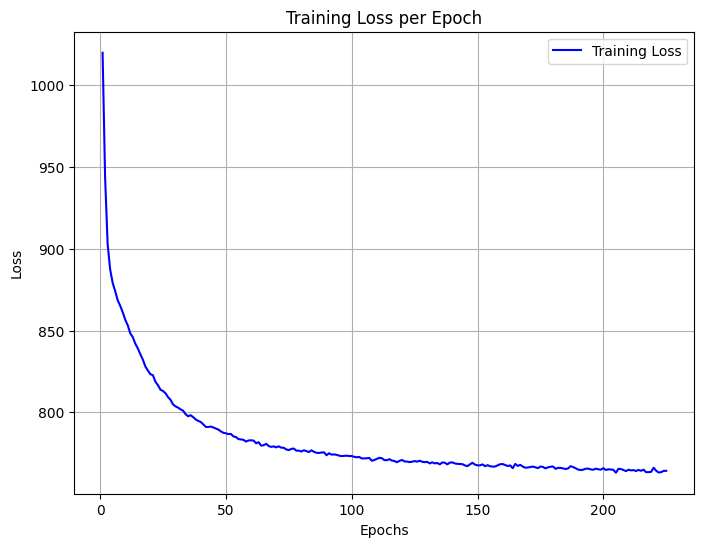

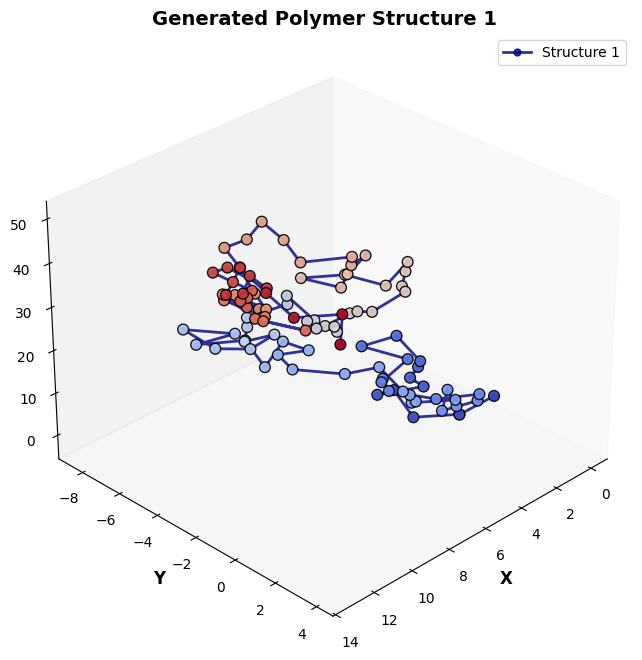

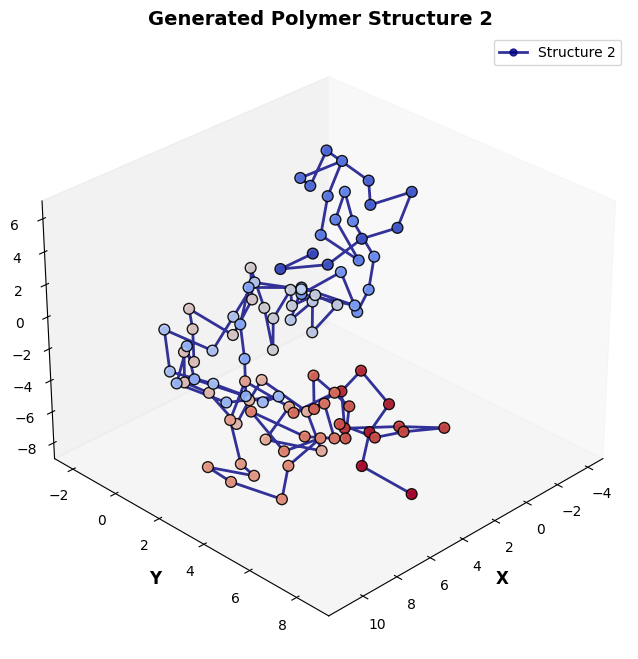

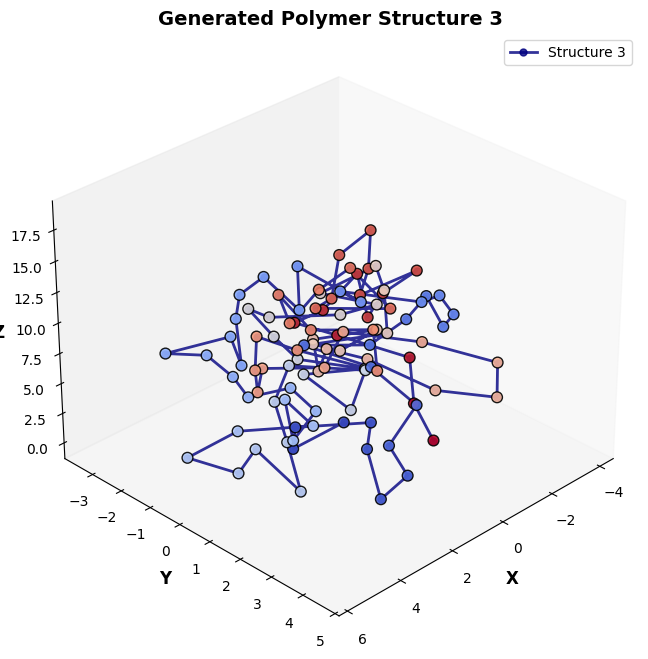

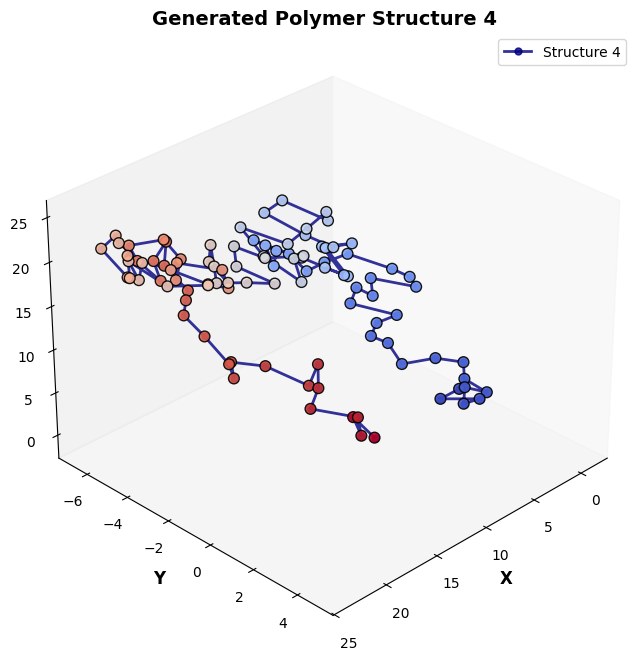

...

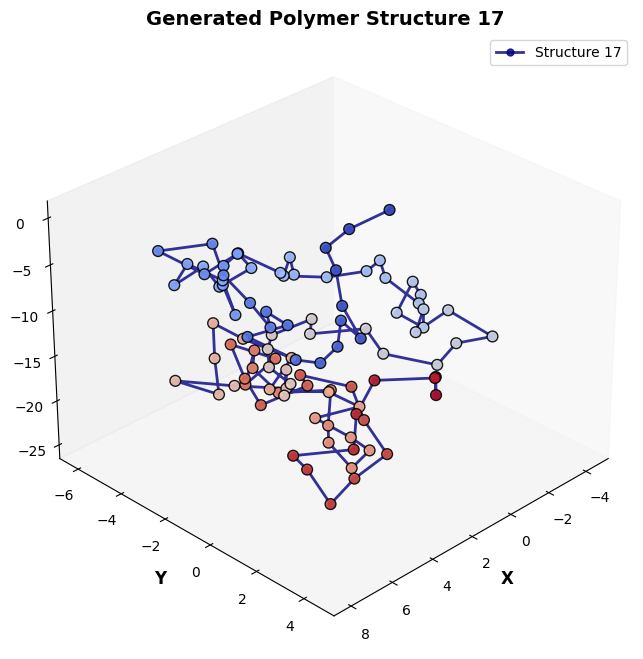

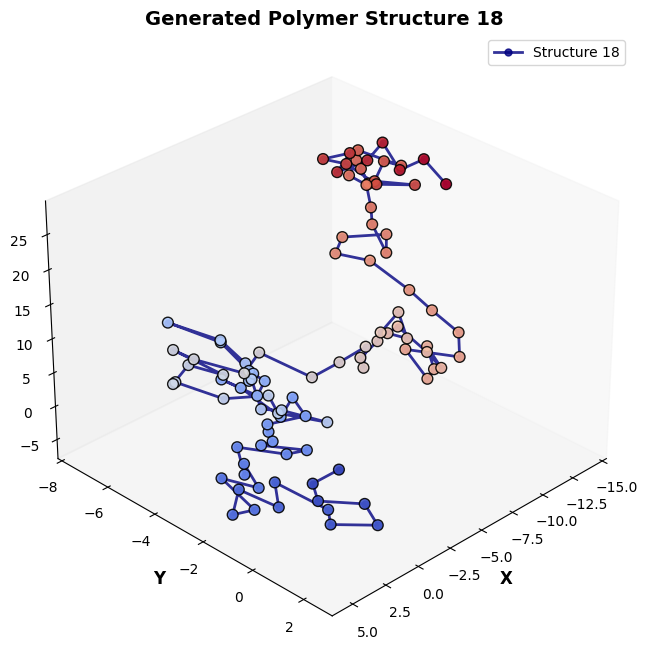

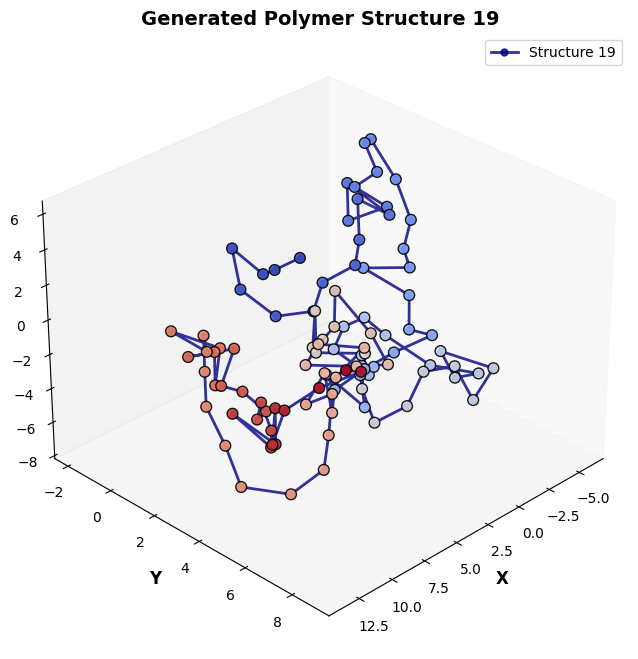

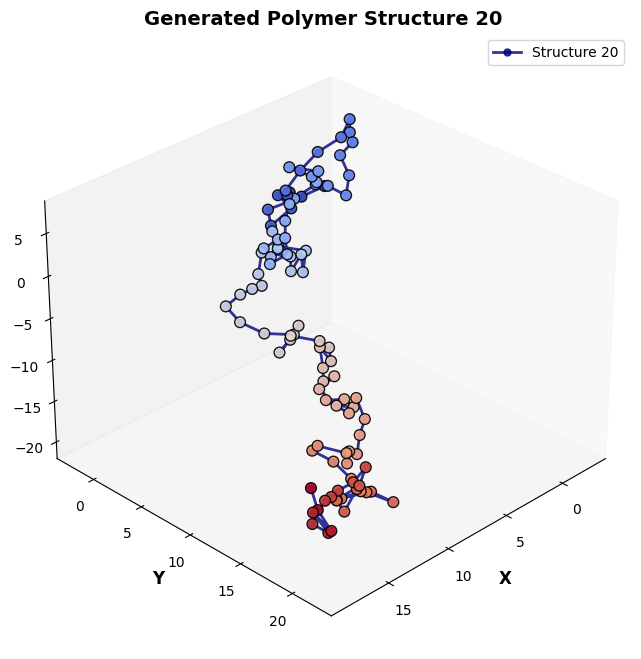

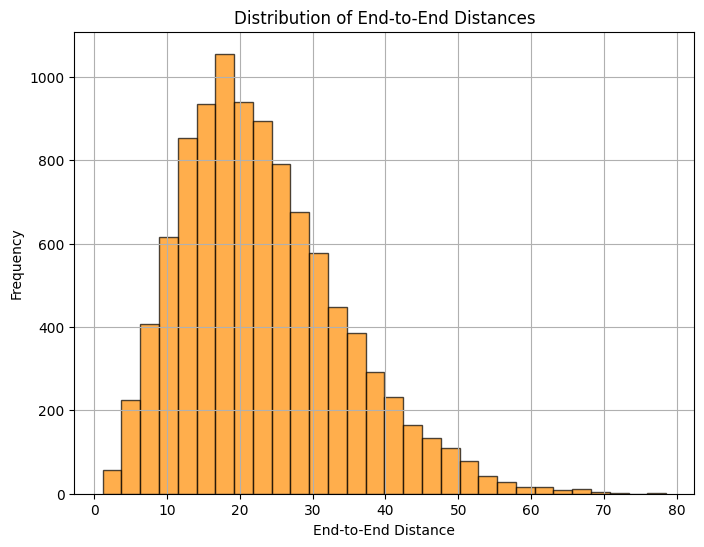

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R

# Load internal coordinates
internal_coords = np.load("/content/internal_coords_optimized.npy")

# Hyperparameters
latent_dim = 40  # Dimensionality of the latent space
batch_size = 64
epochs = 500
bond_length_target = 2.0  # Desired bond length
patience = 20  # Number of epochs to wait before early stopping

# Convert internal coordinates to PyTorch tensors
X = torch.tensor(internal_coords, dtype=torch.float32)

# Define the VAE model
class VAE(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 400)
        self.dropout = nn.Dropout(0.3)  # 30% dropout
        self.fc2 = nn.Linear(400, latent_dim)
        self.fc21 = nn.Linear(400, latent_dim)
        self.fc22 = nn.Linear(400, latent_dim)
        self.fc3 = nn.Linear(latent_dim, 400)
        self.fc4 = nn.Linear(400, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc21(h1), self.fc22(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h3 = torch.relu(self.fc3(z))
        recon_x = self.fc4(h3)

        # Add controlled Gaussian noise to break smooth transitions
        noise = torch.randn_like(recon_x) * 1.4
        recon_x[:, 1:] += noise[:, :-1]  # Add noise to adjacent values

        return recon_x

    def decode_with_fixed_bond_length(self, z, bond_length_target=2.0):
        h3 = torch.relu(self.fc3(z))
        recon_x = self.fc4(h3)
        recon_x += torch.randn_like(recon_x) * 0.05  # Small noise

        new_recon_x = recon_x.clone()  # Avoid in-place modification
        for i in range(1, new_recon_x.shape[0]):
            direction = new_recon_x[i] - new_recon_x[i - 1]
            direction /= torch.norm(direction)  # Normalize the direction
            new_recon_x[i] = new_recon_x[i - 1] + bond_length_target * direction  # Scale to bond length

        return new_recon_x

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar


# Bond length penalty function (using PyTorch)
def bond_length_penalty(coords, bond_length_target=2.0):
    bond_lengths = torch.norm(torch.diff(coords, dim=0), dim=1)
    return torch.sum(torch.abs(bond_lengths - bond_length_target))


# Self-avoidance penalty function (using PyTorch)
def self_avoidance_penalty(coords, min_distance=2.0):
    n_beads = coords.shape[0]
    penalty = 0.0
    for i in range(n_beads):
        for j in range(i + 2, n_beads):
            dist = torch.norm(coords[i] - coords[j])
            if dist < min_distance:
                penalty += (min_distance - dist) ** 12  # Penalize overlap
    return penalty


# Loss function with bond length and self-avoidance penalties
def loss_function(recon_x, x, mu, logvar, bond_length_target=2.0):
    BCE = nn.MSELoss(reduction='sum')(recon_x, x)
    KL = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    # Compute bond length penalty and self-avoidance penalty using PyTorch tensors
    bond_penalty = bond_length_penalty(recon_x, bond_length_target)
    avoidance_penalty = self_avoidance_penalty(recon_x, bond_length_target)

    return BCE + KL + bond_penalty + avoidance_penalty


# Prepare the data loader
dataset = TensorDataset(X)
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Initialize model, optimizer
model = VAE(input_dim=internal_coords.shape[1], latent_dim=latent_dim)
optimizer = optim.AdamW(model.parameters(), lr=1e-3)  # Using AdamW optimizer

# Early stopping initialization
best_loss = float('inf')
no_improvement = 0

# Store losses for visualization
epoch_losses = []

# Train the model
for epoch in range(epochs):
    model.train()
    train_loss = 0
    for batch_idx, (data,) in enumerate(train_loader):
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(data)
        loss = loss_function(recon_batch, data, mu, logvar, bond_length_target)
        loss.backward()
        train_loss += loss.item()
        optimizer.step()

    avg_loss = train_loss / len(train_loader.dataset)
    epoch_losses.append(avg_loss)  # Store loss for this epoch
    print(f"Epoch {epoch + 1}/{epochs}, Loss: {avg_loss}")

    # Early stopping check
    if avg_loss < best_loss:
        best_loss = avg_loss
        no_improvement = 0
        torch.save(model.state_dict(), 'best_vae_model.pth')
    else:
        no_improvement += 1
        if no_improvement >= patience:
            print(f"No improvement for {patience} epochs, stopping training...")
            break

# Plot loss curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(epoch_losses) + 1), epoch_losses,  linestyle='-', color='b', label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training Loss per Epoch")
plt.grid(True)
plt.legend()
plt.show()


# Load the best model
model.load_state_dict(torch.load('best_vae_model.pth'))

# Generate new polymer conformations using the trained VAE model
model.eval()
num_samples = 10000
latent_samples = torch.randn(num_samples, latent_dim) * 2.5  # Increase spread

generated_internal_coords = model.decode(latent_samples).detach().cpu().numpy()


# Function to convert internal coordinates to Cartesian coordinates
def internal_to_cartesian(internal_coords, num_beads=100, bond_length=2.0):
    coords = np.zeros((num_beads, 3))

    bond_lengths = internal_coords[:num_beads - 1]
    bond_angles = internal_coords[num_beads - 1:num_beads - 1 + (num_beads - 2)]
    torsional_angles = internal_coords[num_beads - 1 + (num_beads - 2):]

    # Initialize first bond
    coords[1] = coords[0] + np.array([bond_length, 0, 0])

    for i in range(2, num_beads):
        bond_vec = np.array([bond_lengths[i - 1], 0, 0])  # Start with bond along x-axis
        rot_bond = R.from_euler('y', bond_angles[i - 2], degrees=False).as_matrix()
        rot_torsion = R.from_euler('z', torsional_angles[i - 3], degrees=False).as_matrix()

        bond_vec = rot_bond @ bond_vec
        bond_vec = rot_torsion @ bond_vec

        # Scale bond vector to exactly match the bond length
        bond_vec = bond_length * bond_vec / np.linalg.norm(bond_vec)

        coords[i] = coords[i - 1] + bond_vec

    return coords


# Convert generated internal coordinates to Cartesian coordinates
generated_cartesian_coords = [internal_to_cartesian(internal_coord) for internal_coord in generated_internal_coords]

# Plot the first five generated polymer structures
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Loop through the first five generated polymer structures and plot them separately
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

for i, coords in enumerate(generated_cartesian_coords[:20]):
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plot polymer backbone with a smooth curve
    ax.plot(coords[:, 0], coords[:, 1], coords[:, 2], marker='o', linestyle='-', color="navy", markersize=5, linewidth=2, alpha=0.8, label=f'Structure {i + 1}')

    # Scatter plot for atoms with gradient color
    scatter = ax.scatter(coords[:, 0], coords[:, 1], coords[:, 2], c=np.linspace(0, 1, len(coords)), cmap='coolwarm', s=60, edgecolor='black', alpha=0.9)

    # Labels and title
    ax.set_xlabel('X', fontsize=12, fontweight='bold')
    ax.set_ylabel('Y', fontsize=12, fontweight='bold')
    ax.set_zlabel('Z', fontsize=12, fontweight='bold')
    ax.set_title(f'Generated Polymer Structure {i + 1}', fontsize=14, fontweight='bold')

    # Adjust viewing angle
    ax.view_init(elev=30, azim=45)

    # Remove background grid for a cleaner look
    ax.grid(False)

    # Add legend
    ax.legend(loc='upper right', fontsize=10)

    plt.show()


# Function to compute end-to-end distances
def calculate_end_to_end_distances(cartesian_coords):
    return [np.linalg.norm(coords[-1] - coords[0]) for coords in cartesian_coords]

# Compute end-to-end distances for generated structures
end_to_end_distances = calculate_end_to_end_distances(generated_cartesian_coords)

# Plot the end-to-end distance distribution
plt.figure(figsize=(8, 6))
plt.hist(end_to_end_distances, bins=30, color='darkorange', edgecolor='black', alpha=0.7)
plt.xlabel("End-to-End Distance")
plt.ylabel("Frequency")
plt.title("Distribution of End-to-End Distances")
plt.grid(True)
plt.show()





Epoch 1/500, Train Loss: 3003.4797, Val Loss: 2363.7319
Epoch 2/500, Train Loss: 2338.9834, Val Loss: 2325.5072
Epoch 3/500, Train Loss: 2332.2327, Val Loss: 2327.5956
Epoch 4/500, Train Loss: 2321.8973, Val Loss: 2310.1580
Epoch 5/500, Train Loss: 2308.8340, Val Loss: 2297.2948
Epoch 6/500, Train Loss: 2298.1824, Val Loss: 2287.6361
Epoch 7/500, Train Loss: 2290.3134, Val Loss: 2275.1156
Epoch 8/500, Train Loss: 2272.6724, Val Loss: 2263.4071
Epoch 9/500, Train Loss: 2262.5155, Val Loss: 2254.9022
Epoch 10/500, Train Loss: 2256.2293, Val Loss: 2252.4253
Epoch 11/500, Train Loss: 2250.0857, Val Loss: 2246.9602
Epoch 12/500, Train Loss: 2243.0728, Val Loss: 2236.0503
Epoch 13/500, Train Loss: 2241.0771, Val Loss: 2242.3097
Epoch 14/500, Train Loss: 2234.2394, Val Loss: 2247.4132
Epoch 15/500, Train Loss: 2236.6445, Val Loss: 2226.1796
Epoch 16/500, Train Loss: 2227.2771, Val Loss: 2226.9713
Epoch 17/500, Train Loss: 2225.3578, Val Loss: 2224.1105
Epoch 18/500, Train Loss: 2222.4049, Val

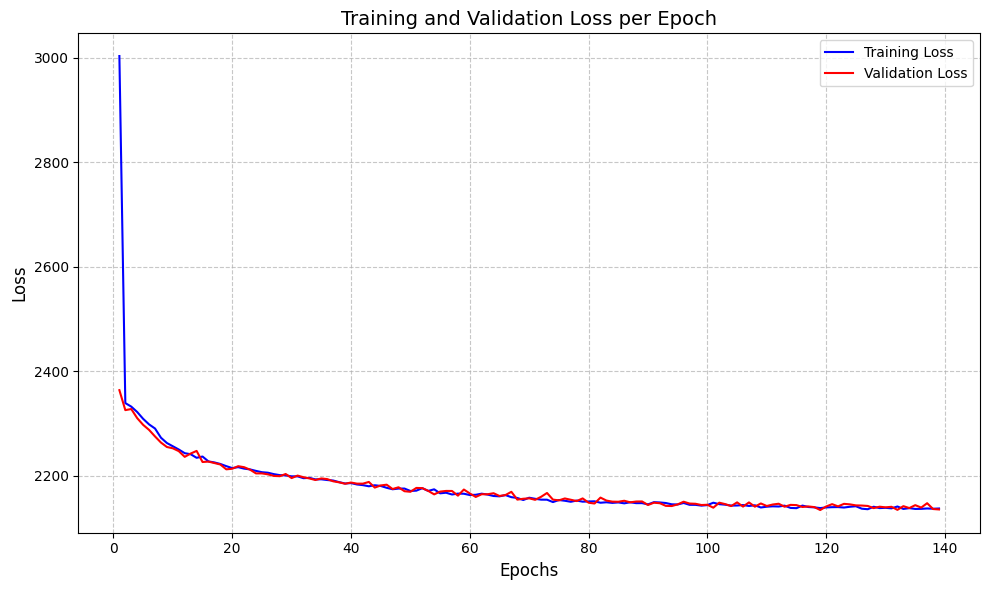

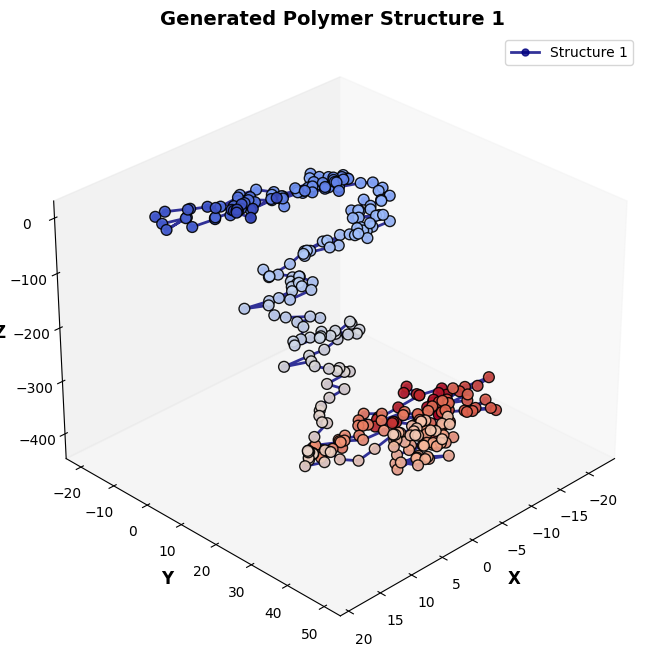

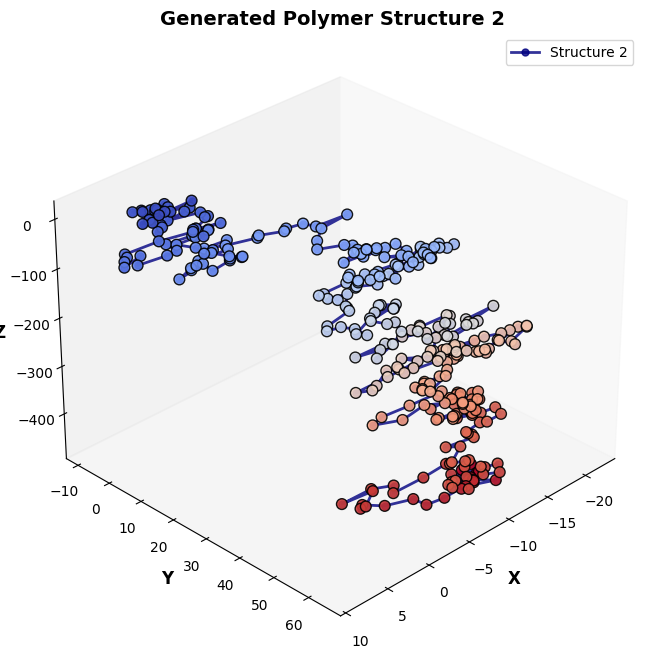

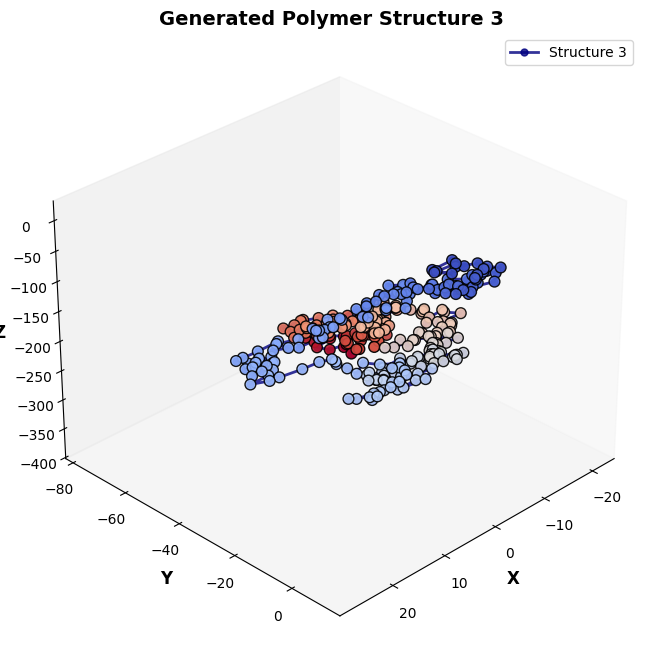

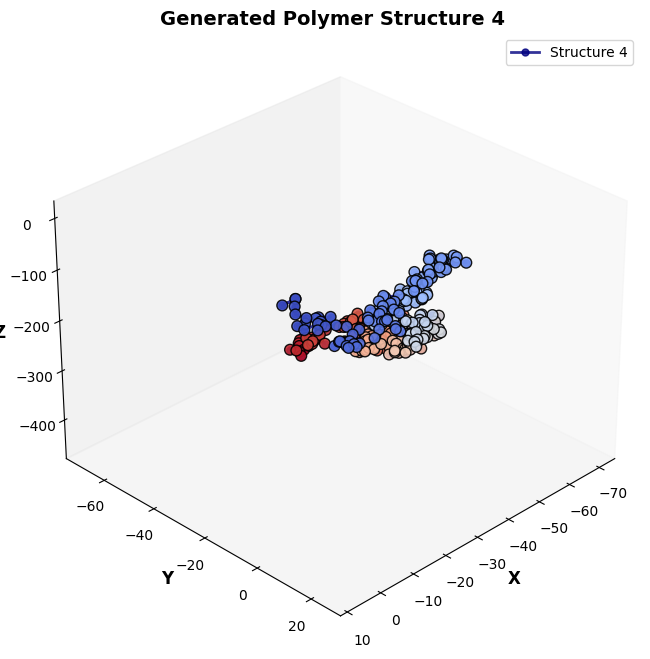

...

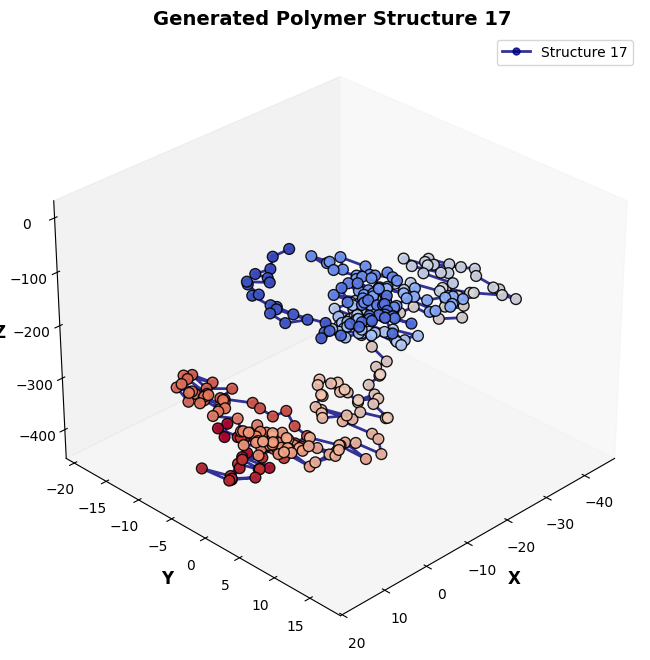

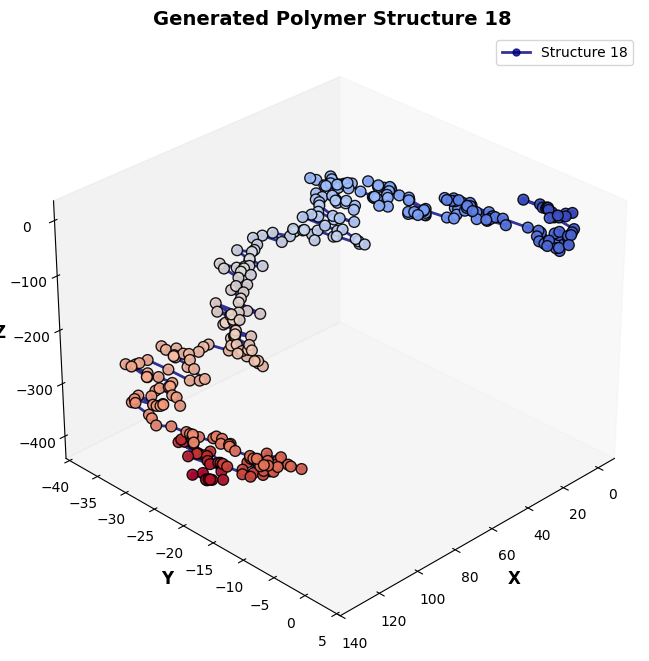

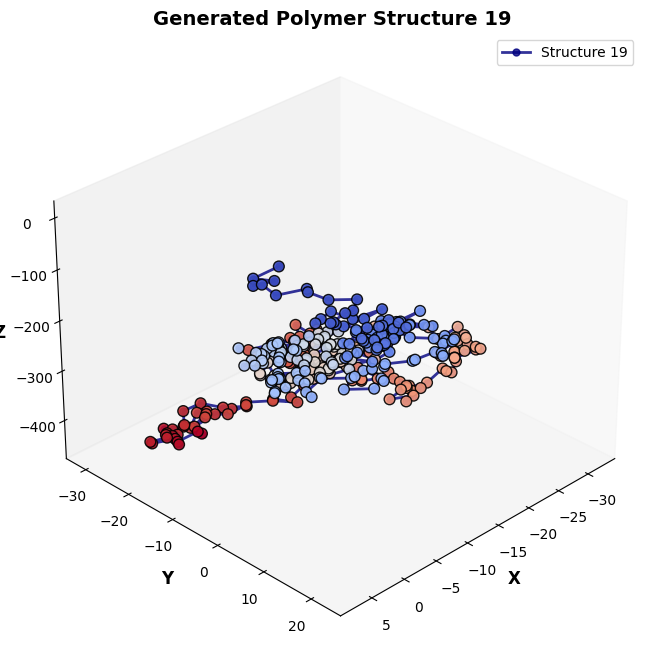

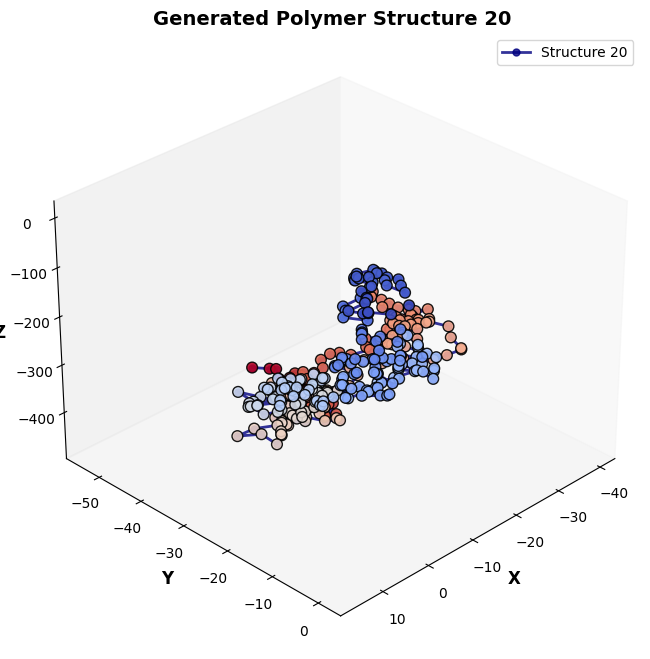

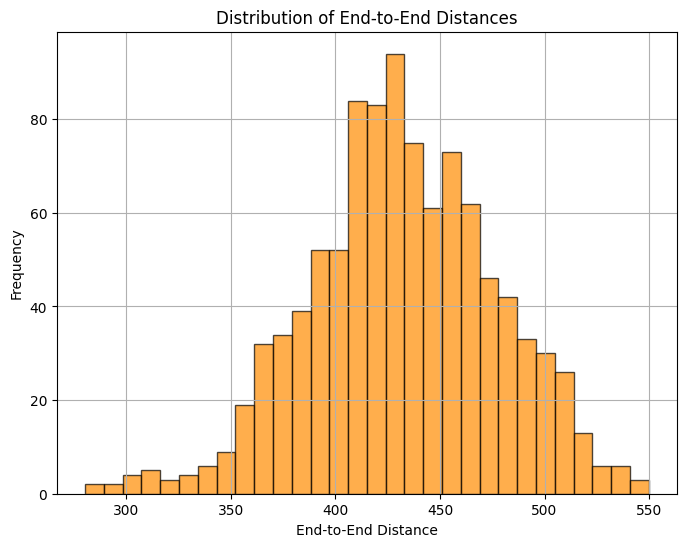

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, random_split
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R

# Load internal coordinates
internal_coords = np.load("/content/internal_coordinates_4_vae.npy")

# Hyperparameters
latent_dim = 40  # Dimensionality of the latent space
batch_size = 64
epochs = 500
bond_length_target = 3.8  # Desired bond length
patience = 20  # Number of epochs to wait before early stopping
validation_split = 0.2  # 20% of data for validation

# Convert internal coordinates to PyTorch tensors
X = torch.tensor(internal_coords, dtype=torch.float32)

# Define the VAE model
class VAE(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 400)
        self.dropout = nn.Dropout(0.3)  # 30% dropout
        self.fc2 = nn.Linear(400, latent_dim)
        self.fc21 = nn.Linear(400, latent_dim)
        self.fc22 = nn.Linear(400, latent_dim)
        self.fc3 = nn.Linear(latent_dim, 400)
        self.fc4 = nn.Linear(400, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc21(h1), self.fc22(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h3 = torch.relu(self.fc3(z))
        recon_x = self.fc4(h3)

        # Add controlled Gaussian noise to break smooth transitions
        #noise = torch.randn_like(recon_x) * 1.4
        #recon_x[:, 1:] += noise[:, :-1]  # Add noise to adjacent values

        return recon_x

    def decode_with_fixed_bond_length(self, z, bond_length_target=3.8):
        h3 = torch.relu(self.fc3(z))
        recon_x = self.fc4(h3)
        recon_x += torch.randn_like(recon_x) * 0.05  # Small noise

        new_recon_x = recon_x.clone()  # Avoid in-place modification
        for i in range(1, new_recon_x.shape[0]):
            direction = new_recon_x[i] - new_recon_x[i - 1]
            direction /= torch.norm(direction)  # Normalize the direction
            new_recon_x[i] = new_recon_x[i - 1] + bond_length_target * direction  # Scale to bond length

        return new_recon_x

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar


# Bond length penalty function (using PyTorch)
def bond_length_penalty(coords, bond_length_target=2.0):
    bond_lengths = torch.norm(torch.diff(coords, dim=0), dim=1)
    return torch.sum(torch.abs(bond_lengths - bond_length_target))


# Self-avoidance penalty function (using PyTorch)
def self_avoidance_penalty(coords, min_distance=3.8):
    n_beads = coords.shape[0]
    penalty = 0.0
    for i in range(n_beads):
        for j in range(i + 2, n_beads):
            dist = torch.norm(coords[i] - coords[j])
            if dist < min_distance:
                penalty += (min_distance - dist) ** 12  # Penalize overlap
    return penalty


# Loss function with bond length and self-avoidance penalties
def loss_function(recon_x, x, mu, logvar, bond_length_target=3.8):
    BCE = nn.MSELoss(reduction='sum')(recon_x, x)
    KL = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    # Compute bond length penalty and self-avoidance penalty using PyTorch tensors
    bond_penalty = bond_length_penalty(recon_x, bond_length_target)
    avoidance_penalty = self_avoidance_penalty(recon_x, bond_length_target)

    return BCE + KL + bond_penalty + avoidance_penalty


# Prepare the data
dataset = TensorDataset(X)

# Split dataset into training and validation sets
dataset_size = len(dataset)
val_size = int(validation_split * dataset_size)
train_size = dataset_size - val_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Initialize model, optimizer
model = VAE(input_dim=internal_coords.shape[1], latent_dim=latent_dim)
optimizer = optim.AdamW(model.parameters(), lr=1e-3)  # Using AdamW optimizer

# Early stopping initialization
best_loss = float('inf')
no_improvement = 0

# Store losses for visualization
train_losses = []
val_losses = []

# Train the model
for epoch in range(epochs):
    # Training phase
    model.train()
    train_loss = 0
    for batch_idx, (data,) in enumerate(train_loader):
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(data)
        loss = loss_function(recon_batch, data, mu, logvar, bond_length_target)
        loss.backward()
        train_loss += loss.item()
        optimizer.step()

    avg_train_loss = train_loss / len(train_dataset)
    train_losses.append(avg_train_loss)

    # Validation phase
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for batch_idx, (data,) in enumerate(val_loader):
            recon_batch, mu, logvar = model(data)
            loss = loss_function(recon_batch, data, mu, logvar, bond_length_target)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_dataset)
    val_losses.append(avg_val_loss)

    print(f"Epoch {epoch + 1}/{epochs}, Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

    # Early stopping check based on validation loss
    if avg_val_loss < best_loss:
        best_loss = avg_val_loss
        no_improvement = 0
        torch.save(model.state_dict(), 'best_vae_model.pth')
    else:
        no_improvement += 1
        if no_improvement >= patience:
            print(f"No improvement in validation loss for {patience} epochs, stopping training...")
            break

# Plot training and validation loss curves
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, linestyle='-', color='blue', label="Training Loss")
plt.plot(range(1, len(val_losses) + 1), val_losses, linestyle='-', color='red', label="Validation Loss")
plt.xlabel("Epochs", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.title("Training and Validation Loss per Epoch", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=10)
plt.tight_layout()
plt.savefig('vae_training_validation_loss.png', dpi=300)
plt.show()

# Load the best model
model.load_state_dict(torch.load('best_vae_model.pth'))

# Generate new polymer conformations using the trained VAE model
model.eval()
num_samples = 1000
latent_samples = torch.randn(num_samples, latent_dim) * 2.5  # Increase spread

generated_internal_coords = model.decode(latent_samples).detach().cpu().numpy()


# Function to convert internal coordinates to Cartesian coordinates
def internal_to_cartesian(internal_coords, num_beads=341, bond_length=3.8):
    coords = np.zeros((num_beads, 3))

    bond_lengths = internal_coords[:num_beads - 1]
    bond_angles = internal_coords[num_beads - 1:num_beads - 1 + (num_beads - 2)]
    torsional_angles = internal_coords[num_beads - 1 + (num_beads - 2):]

    # Initialize first bond
    coords[1] = coords[0] + np.array([bond_length, 0, 0])

    for i in range(2, num_beads):
        bond_vec = np.array([bond_lengths[i - 1], 0, 0])  # Start with bond along x-axis
        rot_bond = R.from_euler('y', bond_angles[i - 2], degrees=False).as_matrix()
        rot_torsion = R.from_euler('z', torsional_angles[i - 3], degrees=False).as_matrix()

        bond_vec = rot_bond @ bond_vec
        bond_vec = rot_torsion @ bond_vec

        # Scale bond vector to exactly match the bond length
        bond_vec = bond_length * bond_vec / np.linalg.norm(bond_vec)

        coords[i] = coords[i - 1] + bond_vec

    return coords


# Convert generated internal coordinates to Cartesian coordinates
generated_cartesian_coords = [internal_to_cartesian(internal_coord) for internal_coord in generated_internal_coords]

# Plot the first five generated polymer structures
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Loop through the first five generated polymer structures and plot them separately
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

for i, coords in enumerate(generated_cartesian_coords[:20]):
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plot polymer backbone with a smooth curve
    ax.plot(coords[:, 0], coords[:, 1], coords[:, 2], marker='o', linestyle='-', color="navy", markersize=5, linewidth=2, alpha=0.8, label=f'Structure {i + 1}')

    # Scatter plot for atoms with gradient color
    scatter = ax.scatter(coords[:, 0], coords[:, 1], coords[:, 2], c=np.linspace(0, 1, len(coords)), cmap='coolwarm', s=60, edgecolor='black', alpha=0.9)

    # Labels and title
    ax.set_xlabel('X', fontsize=12, fontweight='bold')
    ax.set_ylabel('Y', fontsize=12, fontweight='bold')
    ax.set_zlabel('Z', fontsize=12, fontweight='bold')
    ax.set_title(f'Generated Polymer Structure {i + 1}', fontsize=14, fontweight='bold')

    # Adjust viewing angle
    ax.view_init(elev=30, azim=45)

    # Remove background grid for a cleaner look
    ax.grid(False)

    # Add legend
    ax.legend(loc='upper right', fontsize=10)

    plt.show()


# Function to compute end-to-end distances
def calculate_end_to_end_distances(cartesian_coords):
    return [np.linalg.norm(coords[-1] - coords[0]) for coords in cartesian_coords]

# Compute end-to-end distances for generated structures
end_to_end_distances = calculate_end_to_end_distances(generated_cartesian_coords)

# Plot the end-to-end distance distribution
plt.figure(figsize=(8, 6))
plt.hist(end_to_end_distances, bins=30, color='darkorange', edgecolor='black', alpha=0.7)
plt.xlabel("End-to-End Distance")
plt.ylabel("Frequency")
plt.title("Distribution of End-to-End Distances")
plt.grid(True)
plt.show()
def save_structures_to_pdb(coords_list, filename="generated_structures.pdb"):
    with open(filename, "w") as f:
        for model_idx, coords in enumerate(coords_list):
            f.write(f"MODEL     {model_idx + 1}\n")
            for atom_idx, (x, y, z) in enumerate(coords, 1):
                f.write(f"ATOM  {atom_idx:5d}  CA  ALA A{atom_idx:4d}    {x:8.3f}{y:8.3f}{z:8.3f}  1.00  0.00           C\n")
            f.write("ENDMDL\n")
save_structures_to_pdb(generated_cartesian_coords, filename="generated_structures.pdb")


In [ ]:
print (min(end_to_end_distances) )
print (max(end_to_end_distances) )

0.9145225208682304
83.59958989647194


In [ ]:
def compute_bond_lengths(cartesian_coords):
    bond_lengths_all = []
    for coords in cartesian_coords:
        bond_lengths = np.linalg.norm(np.diff(coords, axis=0), axis=1)
        bond_lengths_all.extend(bond_lengths)
    return bond_lengths_all

# Compute all bond lengths from the generated structures
all_bond_lengths = compute_bond_lengths(generated_cartesian_coords)

# Print min and max bond lengths
print(f"Minimum bond length: {np.min(all_bond_lengths):.4f}")
print(f"Maximum bond length: {np.max(all_bond_lengths):.4f}")


Minimum bond length: 2.0000
Maximum bond length: 2.0000


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Utilities for computing angles
def compute_bond_lengths(coords):
    return np.linalg.norm(coords[1:] - coords[:-1], axis=1)

def compute_bond_angles(coords):
    vectors = coords[1:] - coords[:-1]
    norms = np.linalg.norm(vectors, axis=1, keepdims=True)
    vectors = vectors / norms
    angles = []
    for i in range(1, len(vectors)):
        cos_angle = np.clip(np.dot(vectors[i - 1], vectors[i]), -1.0, 1.0)
        angle = np.arccos(cos_angle)
        angles.append(np.degrees(angle))  # Convert to degrees
    return np.array(angles)

def compute_torsion_angles(coords):
    torsion_angles = []
    for i in range(len(coords) - 3):
        p0, p1, p2, p3 = coords[i:i+4]

        b0 = p1 - p0
        b1 = p2 - p1
        b2 = p3 - p2

        # Normalize b1 for projection
        b1 /= np.linalg.norm(b1)

        v = b0 - np.dot(b0, b1) * b1
        w = b2 - np.dot(b2, b1) * b1

        x = np.dot(v, w)
        y = np.dot(np.cross(b1, v), w)

        angle = np.degrees(np.arctan2(y, x))
        torsion_angles.append(angle)
    return np.array(torsion_angles)


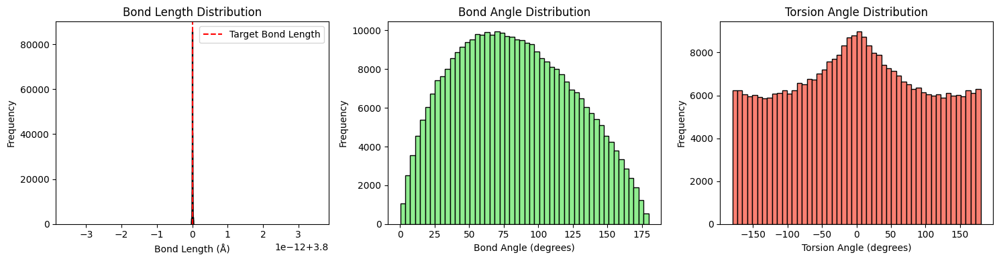

In [ ]:
# Containers for all generated stats
all_bond_lengths = []
all_bond_angles = []
all_torsion_angles = []

# Compute angles for all generated structures
for coords in generated_cartesian_coords:
    all_bond_lengths.extend(compute_bond_lengths(coords))
    all_bond_angles.extend(compute_bond_angles(coords))
    all_torsion_angles.extend(compute_torsion_angles(coords))

# Convert to numpy arrays
all_bond_lengths = np.array(all_bond_lengths)
all_bond_angles = np.array(all_bond_angles)
all_torsion_angles = np.array(all_torsion_angles)

# Plot bond length distribution
plt.figure(figsize=(15, 4))

plt.subplot(1, 3, 1)
plt.hist(all_bond_lengths, bins=50, color='skyblue', edgecolor='black')
plt.axvline(3.8, color='red', linestyle='--', label='Target Bond Length')
plt.title("Bond Length Distribution")
plt.xlabel("Bond Length (Å)")
plt.ylabel("Frequency")
plt.legend()

# Plot bond angle distribution
plt.subplot(1, 3, 2)
plt.hist(all_bond_angles, bins=50, color='lightgreen', edgecolor='black')
plt.title("Bond Angle Distribution")
plt.xlabel("Bond Angle (degrees)")
plt.ylabel("Frequency")

# Plot torsion angle distribution
plt.subplot(1, 3, 3)
plt.hist(all_torsion_angles, bins=50, color='salmon', edgecolor='black')
plt.title("Torsion Angle Distribution")
plt.xlabel("Torsion Angle (degrees)")
plt.ylabel("Frequency")

plt.tight_layout()
plt.savefig('generated_structure_distributions.png', dpi=300)
plt.show()


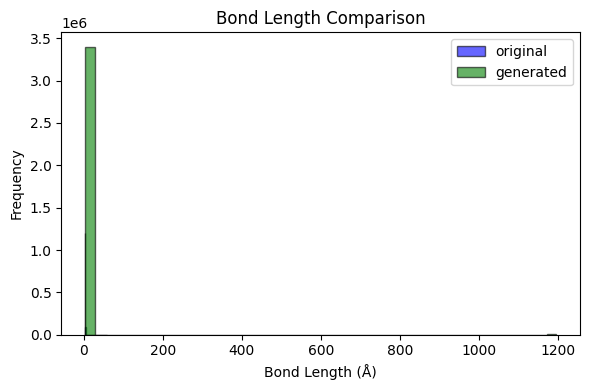

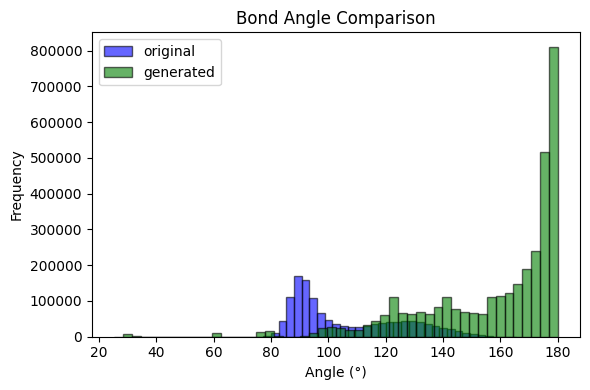

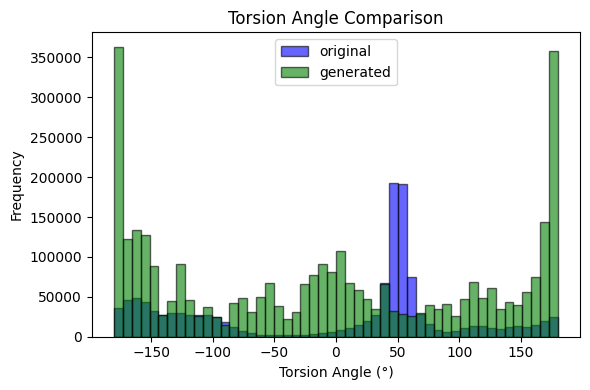

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser
from math import acos, degrees
import os


def load_ca_coords(pdb_file):
    parser = PDBParser(QUIET=True)
    structure = parser.get_structure('structure', pdb_file)
    ca_coords = []

    for model in structure:
        for chain in model:
            for residue in chain:
                if 'CA' in residue:
                    ca_coords.append(residue['CA'].get_vector().get_array())

    return np.array(ca_coords)


def compute_bond_lengths(coords):
    return np.linalg.norm(coords[1:] - coords[:-1], axis=1)


def compute_bond_angles(coords):
    a = coords[:-2]
    b = coords[1:-1]
    c = coords[2:]

    ba = a - b
    bc = c - b

    cosine_angles = np.sum(ba * bc, axis=1) / (
        np.linalg.norm(ba, axis=1) * np.linalg.norm(bc, axis=1))
    angles = np.arccos(np.clip(cosine_angles, -1.0, 1.0))
    return np.degrees(angles)


def compute_torsion_angles(coords):
    torsions = []
    for i in range(len(coords) - 3):
        p0 = coords[i]
        p1 = coords[i + 1]
        p2 = coords[i + 2]
        p3 = coords[i + 3]

        b0 = -1.0 * (p1 - p0)
        b1 = p2 - p1
        b2 = p3 - p2

        b1 /= np.linalg.norm(b1)

        v = b0 - np.dot(b0, b1) * b1
        w = b2 - np.dot(b2, b1) * b1

        x = np.dot(v, w)
        y = np.dot(np.cross(b1, v), w)
        torsion = np.degrees(np.arctan2(y, x))
        torsions.append(torsion)
    return np.array(torsions)


def plot_comparison(data1, data2, label1, label2, title, xlabel, filename):
    plt.figure(figsize=(6, 4))
    plt.hist(data1, bins=50, alpha=0.6, label=label1, color='blue', edgecolor='black')
    plt.hist(data2, bins=50, alpha=0.6, label=label2, color='green', edgecolor='black')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel("Frequency")
    plt.legend()
    plt.tight_layout()
    plt.savefig(filename, dpi=300)
    plt.show()


# === 📁 Replace with your PDB file paths ===
pdb_file_1 = "/content/open_close.pdb"
pdb_file_2 = "/content/generated_structures.pdb"

# === 📌 Extract and compute ===
coords1 = load_ca_coords(pdb_file_1)
coords2 = load_ca_coords(pdb_file_2)

bond_lengths_1 = compute_bond_lengths(coords1)
bond_lengths_2 = compute_bond_lengths(coords2)

bond_angles_1 = compute_bond_angles(coords1)
bond_angles_2 = compute_bond_angles(coords2)

torsion_angles_1 = compute_torsion_angles(coords1)
torsion_angles_2 = compute_torsion_angles(coords2)

# === 📊 Plot comparison ===
plot_comparison(bond_lengths_1, bond_lengths_2, "original", "generated",
                "Bond Length Comparison", "Bond Length (Å)", "bond_length_comparison.png")

plot_comparison(bond_angles_1, bond_angles_2, "original", "generated",
                "Bond Angle Comparison", "Angle (°)", "bond_angle_comparison.png")

plot_comparison(torsion_angles_1, torsion_angles_2, "original", "generated",
                "Torsion Angle Comparison", "Torsion Angle (°)", "torsion_angle_comparison.png")


In [ ]:
fix_pdb_format("/content/generated_structures_closebon_4.pdb", "fixed.pdb")
